In [8]:
import os
import json
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils

In [9]:
# Define directories and load data
image_directory = '../data/depth-anything-v2-set2/images/'      # Directory containing original images
csv_file = "../data/csv/depth-anything-v2-updated-with-annotations-v2.csv"    # CSV file with Lx0, Ly0, Lx1, Ly1
json_file = '../data/depth-anything-v2-set2/annotations/instances_default.json'  # JSON file with annotations

# Load the COCO annotations
coco = COCO(json_file)

# Load the CSV file
csv_data = pd.read_csv(csv_file)

# Ensure that 'image_name' column exists and matches the image filenames
if 'image_name' not in csv_data.columns:
    print("Error: 'image_name' column not found in CSV file.")
else:
    print("CSV data loaded successfully.")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
CSV data loaded successfully.


In [10]:
def create_mask_from_annotation(ann, img_height, img_width):
    segmentation = ann['segmentation']
    
    if isinstance(segmentation, list):  # Polygon format
        mask = np.zeros((img_height, img_width), dtype=np.uint8)
        # Convert polygons to a mask
        for poly in segmentation:
            poly = np.array(poly).reshape((-1, 2))  # Reshape to (N, 2)
            cv2.fillPoly(mask, [np.int32(poly)], 1)  # Fill the polygon with 1's

    elif isinstance(segmentation, dict) and 'counts' in segmentation:  # RLE format
        rle = segmentation
        if isinstance(rle['counts'], list):  # Uncompressed RLE
            rle = maskUtils.frPyObjects([rle], img_height, img_width)
        mask = maskUtils.decode(rle)  # Decode RLE to binary mask

    else:
        mask = None  # Segmentation format not recognized

    return mask


In [11]:
def create_bounding_boxes_from_json(anns):
    """
    Creates a list of bounding boxes from JSON annotations.
    Each bounding box is in the format [x, y, width, height].
    """
    json_bboxes = []
    for ann in anns:
        bbox = ann['bbox']  # [x, y, width, height]
        json_bboxes.append(bbox)
    return json_bboxes


In [14]:
def create_bounding_boxes_from_csv(csv_data, image_name_with_ext):
    """
    Creates a list of bounding boxes from CSV data for a given image.
    Each bounding box is in the format [x, y, width, height].
    """
    csv_bboxes = []
    # Filter CSV data for the current image
    csv_rows = csv_data[csv_data['image_name'] == image_name_with_ext]
    for _, row in csv_rows.iterrows():
        Lx0 = row['Lx0']
        Ly0 = row['Ly0']
        Lx1 = row['Lx1']
        Ly1 = row['Ly1']
        # Convert Lx0, Ly0, Lx1, Ly1 to x, y, width, height format
        x_min = min(Lx0, Lx1)
        y_min = min(Ly0, Ly1)
        x_max = max(Lx0, Lx1)
        y_max = max(Ly0, Ly1)
        width = x_max - x_min
        height = y_max - y_min
        csv_bboxes.append([x_min, y_min, width, height])
    return csv_bboxes


101_exp92_L_22213


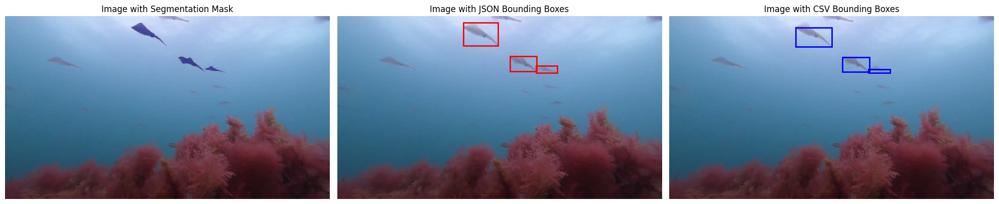

105_exp96_L_11815


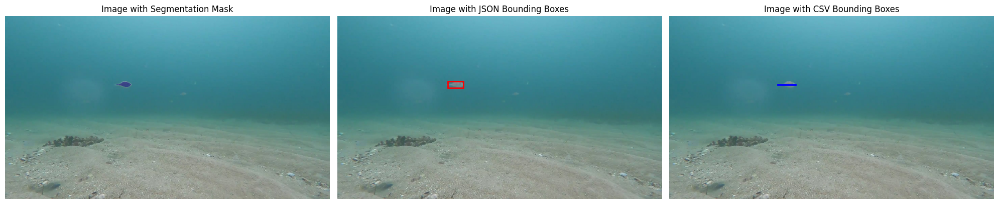

116_exp92_L_2546


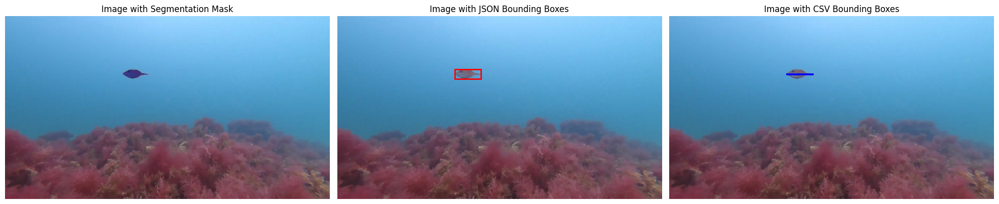

11_exp83_L_1646


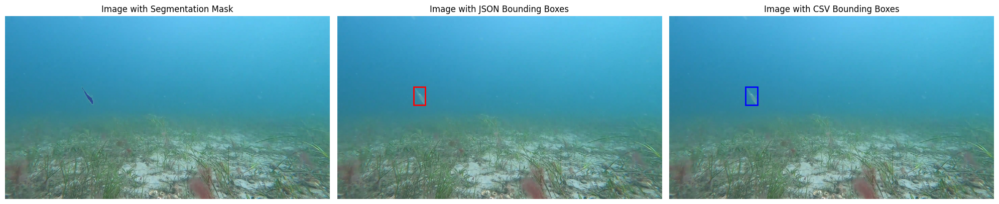

130_exp96_L_15036


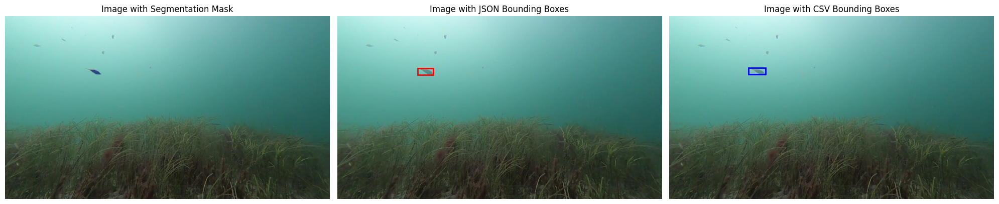

1_exp83_L_3542


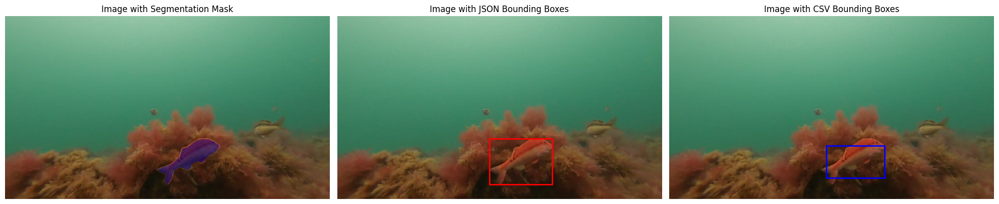

1_exp83_L_3600


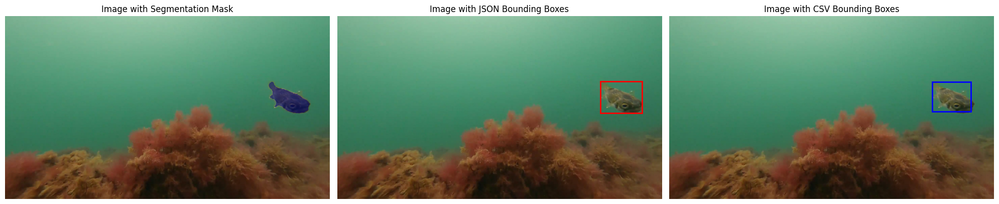

21_exp92_L_8951


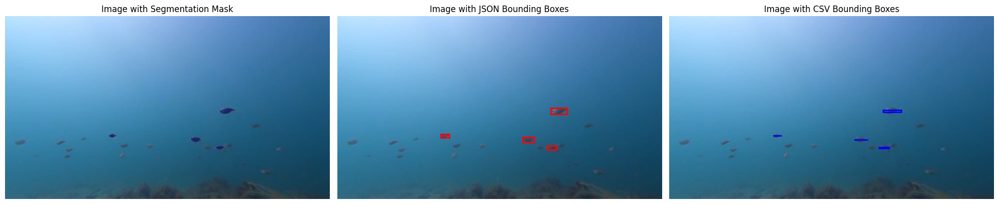

2_exp92_L_24756


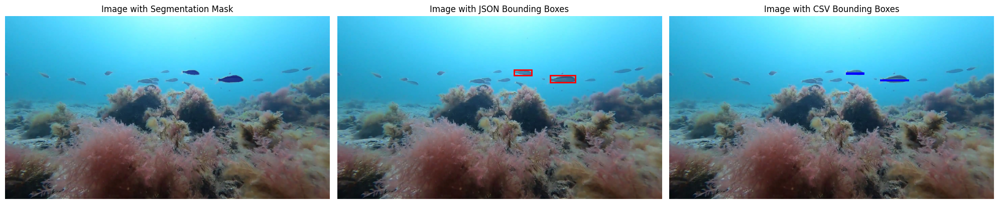

3001_exp107_L_14622


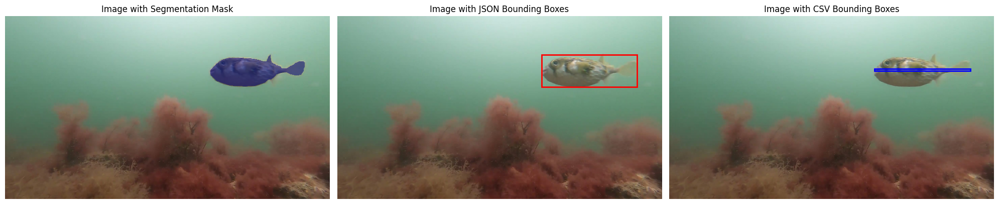

3012_exp96_L_12885


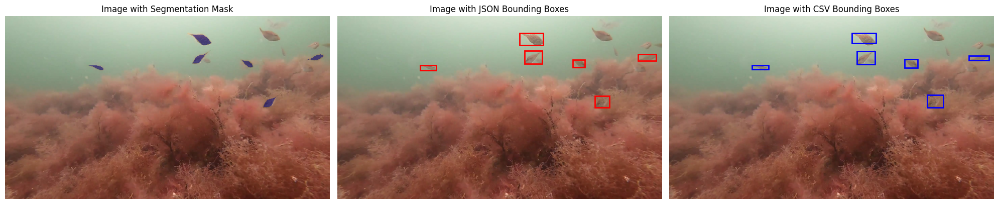

3017_exp96_L_7365


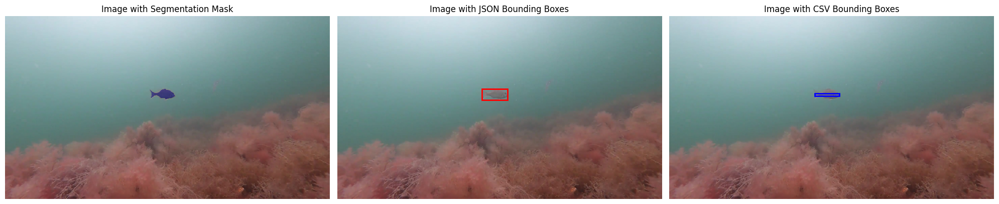

3040_exp83_L_19869


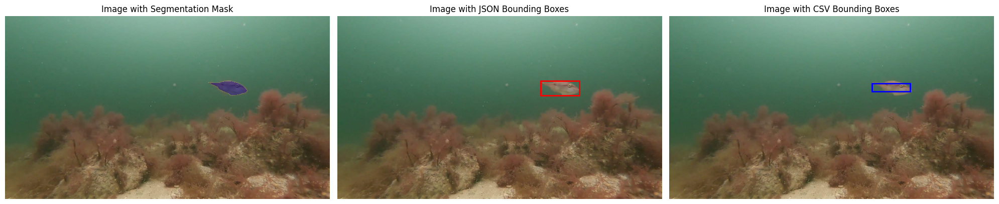

3042_exp95_L_16608


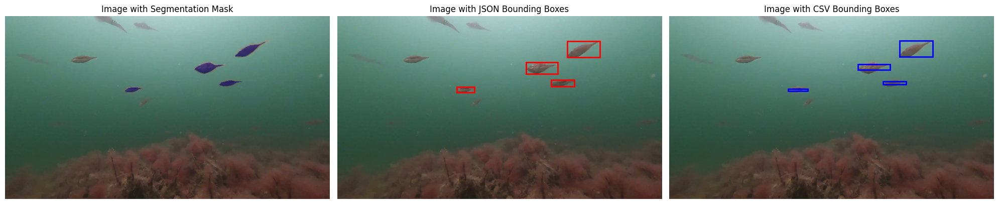

3063_exp104_L_4482


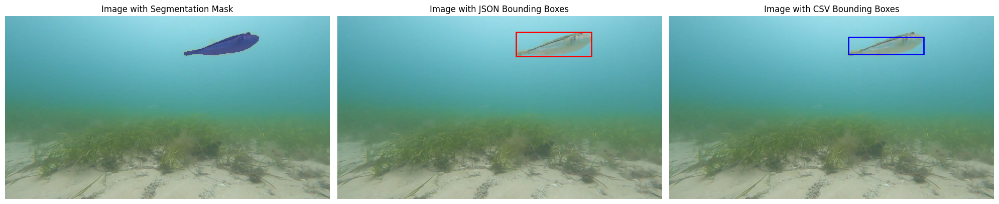

4022_exp96_L_18169


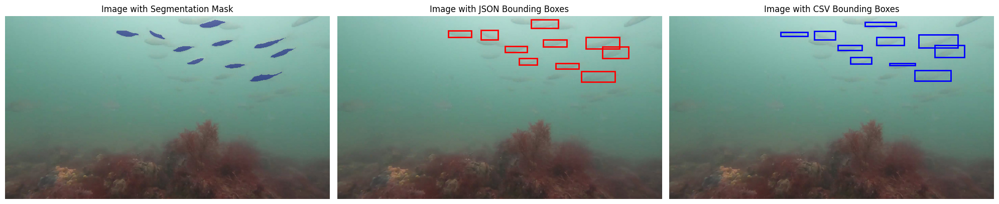

4022_exp96_L_18187


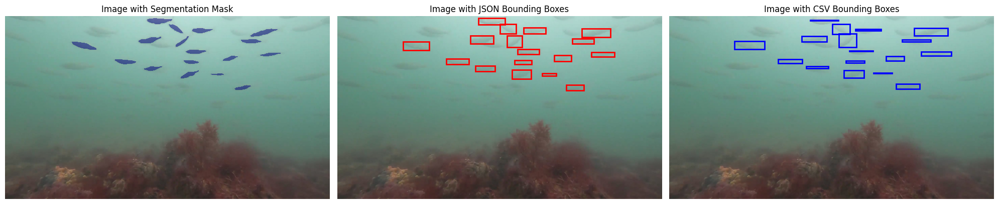

4023_exp95_L_4051


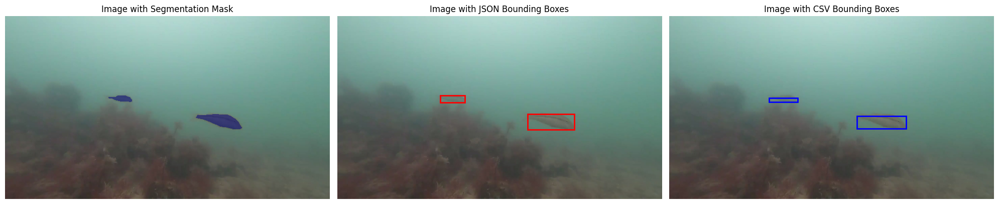

4028_exp104_L_21124


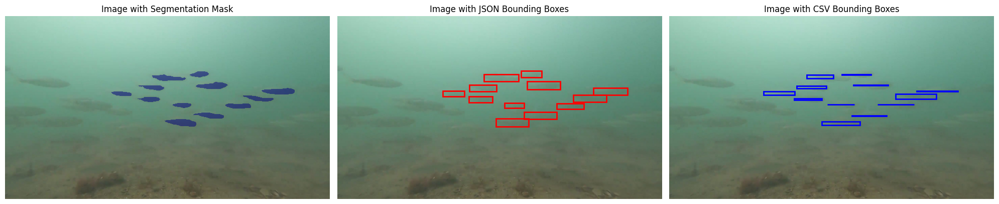

4056_exp104_L_18121


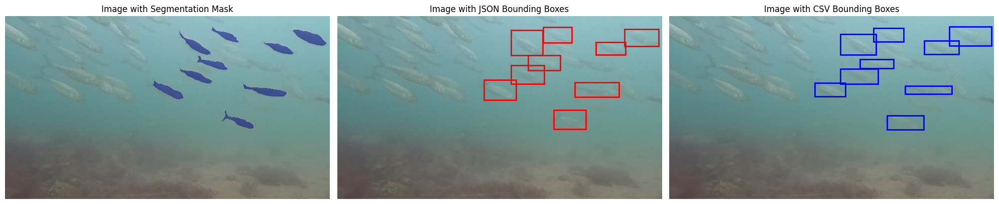

4073_exp83_L_19710


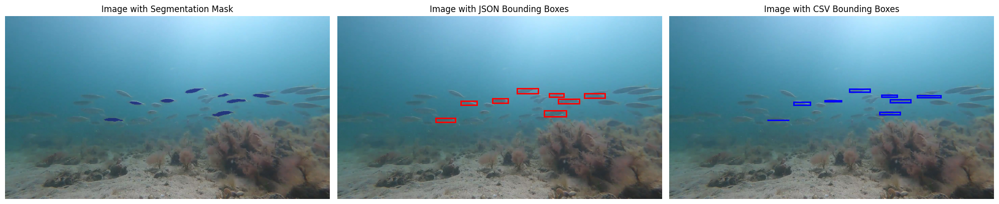

4074_exp96_L_18711


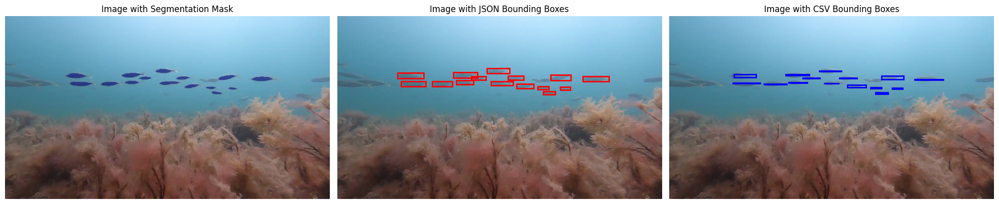

4081_exp97_L_21298


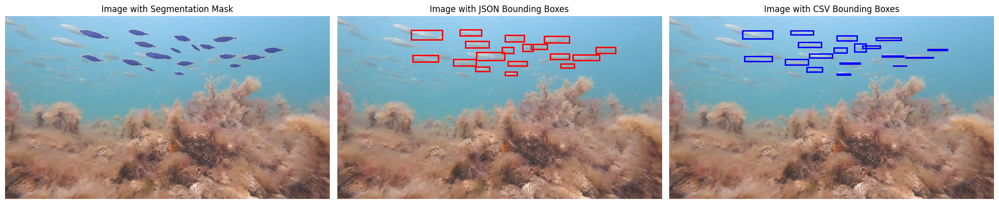

4085_exp95_L_9287


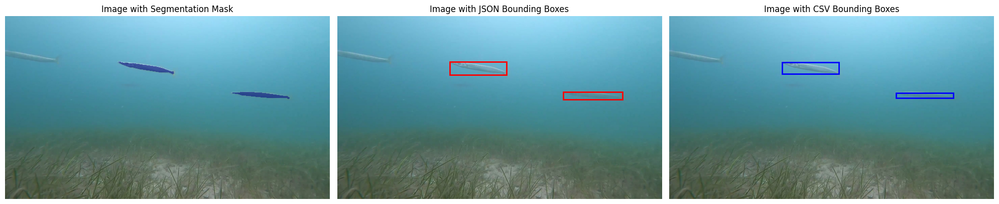

42_exp94_L_1947


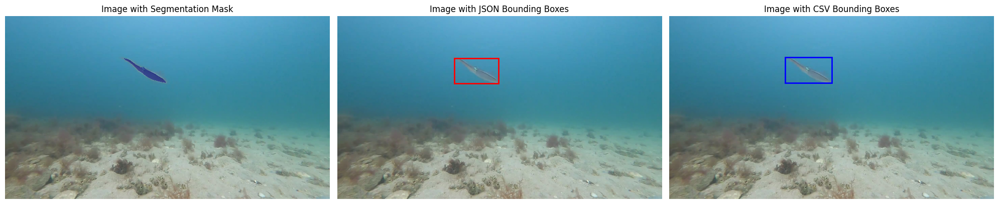

43_exp96_L_17856


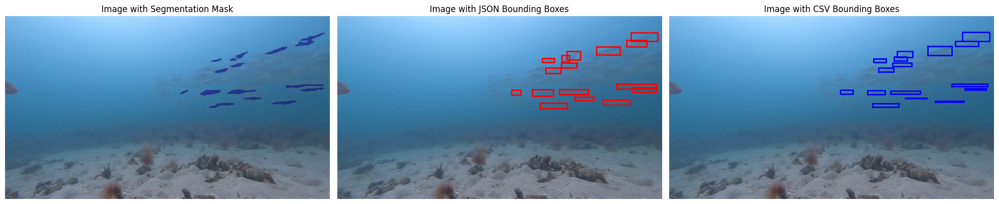

43_exp96_L_18580


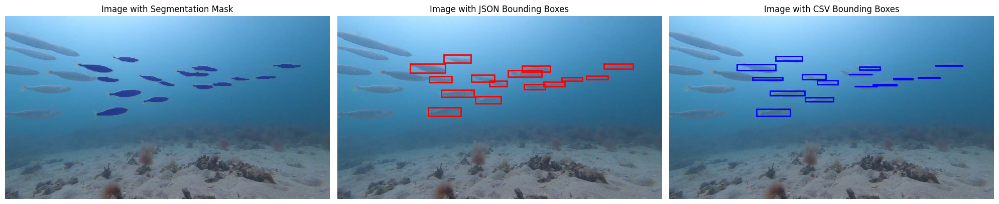

44_exp92_L_1656


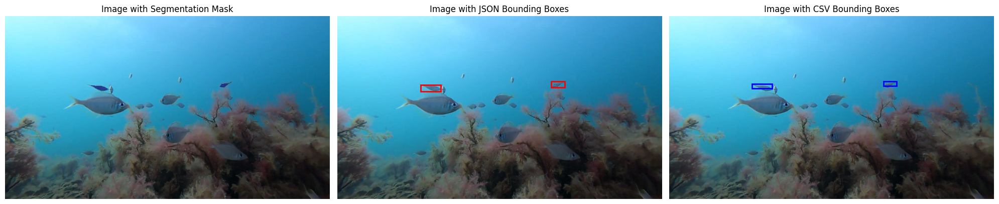

45_exp97_L_12950


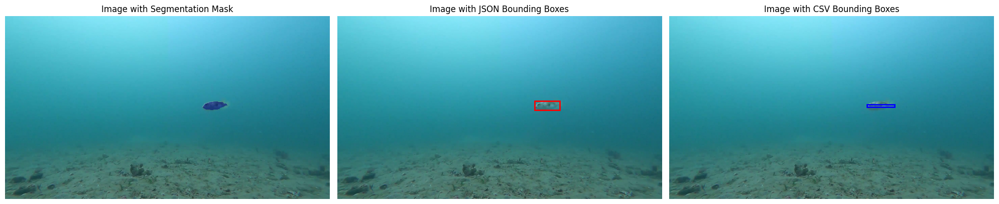

523_exp104_L_21065


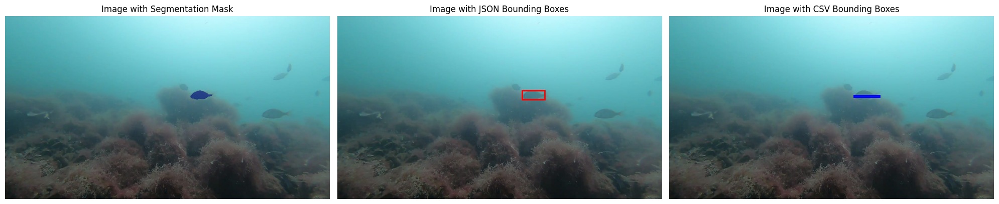

gp9-27_GX010042_frame_0001


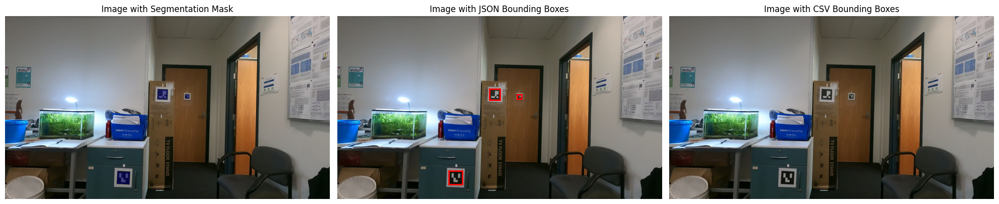

gp9-27_GX010043_frame_0010


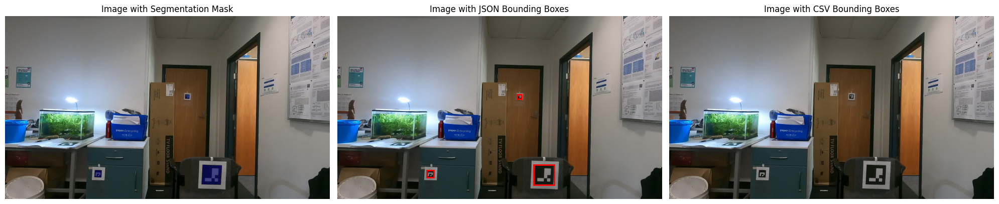

gp9-27_GX010047_frame_0001


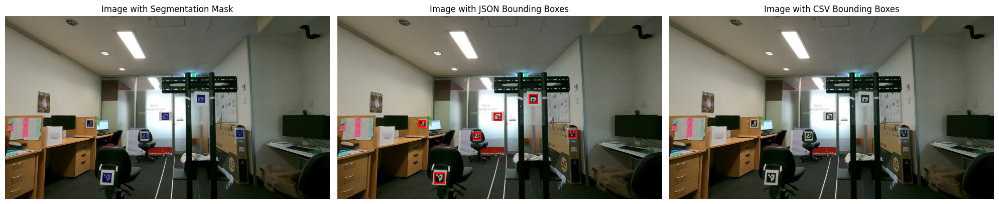

gp9-27_GX010049_frame_0001


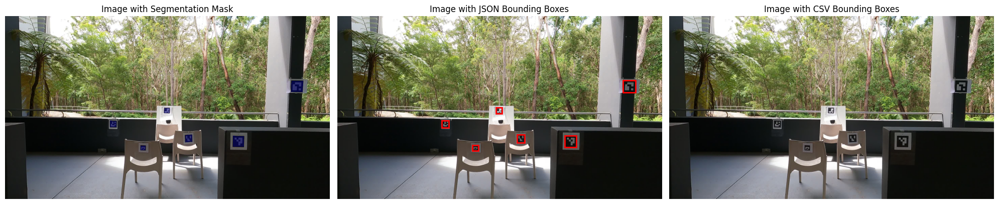

mono_03_1_19086


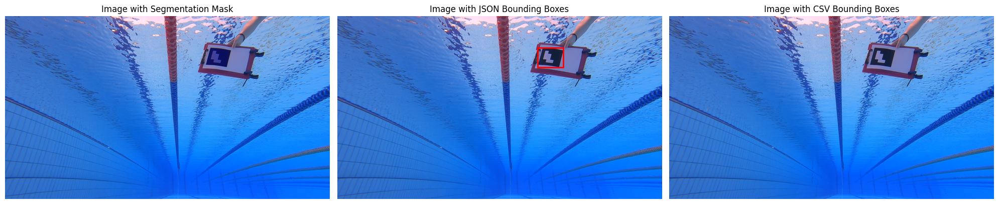

mono_03_7_2500


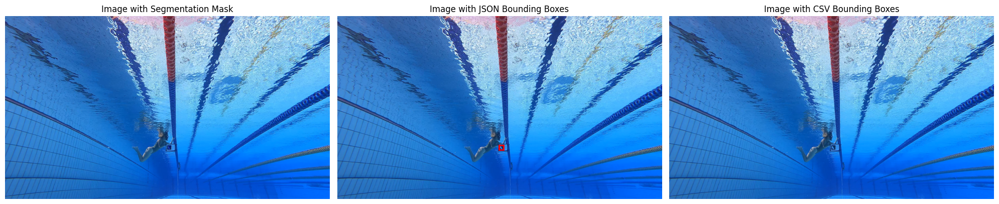

mono_04_10_8780


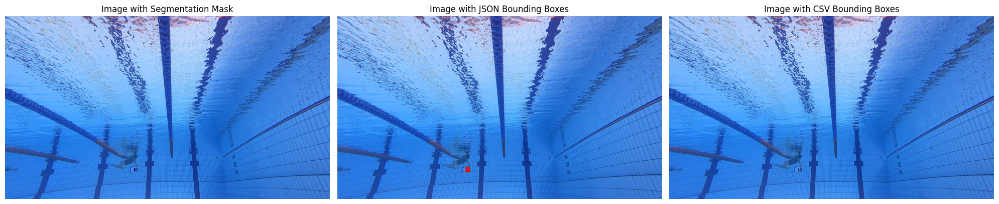

mono_04_1_6507


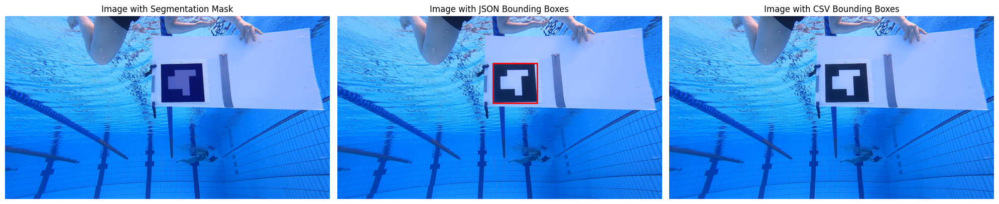

mono_04_2_10900


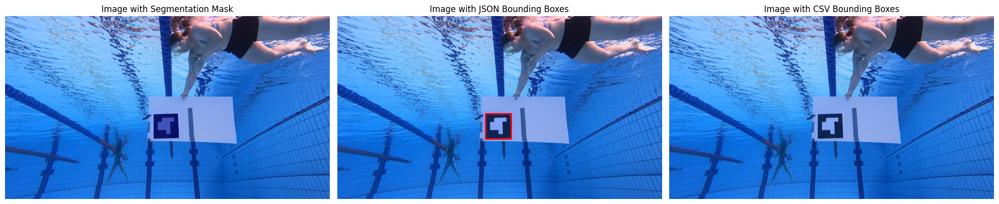

mono_04_7_20150


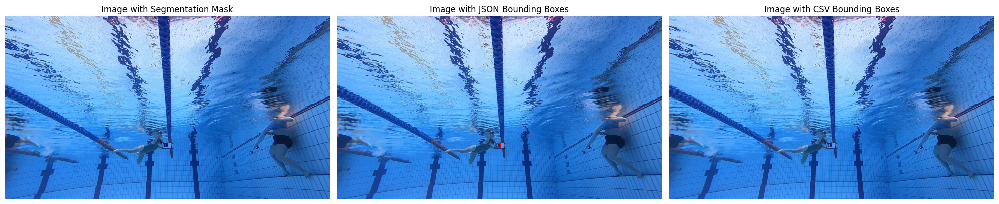

In [22]:
# Get all image IDs
image_ids = coco.getImgIds()

# For demonstration, limit to a few images
# image_ids = image_ids[:5]  # Uncomment to process only the first 5 images

# Process each image
for img_id in image_ids:
    # Load image information
    img_info = coco.loadImgs(img_id)[0]
    img_name_with_ext = img_info['file_name']
    img_name = os.path.splitext(img_name_with_ext)[0]
    img_height = img_info['height']
    img_width = img_info['width']
    
    # Load the image
    img_path = os.path.join(image_directory, img_name_with_ext)
    if not os.path.exists(img_path):
        print(f"Image {img_name_with_ext} not found.")
        continue
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Get annotations for the image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    
    # Create segmentation mask
    full_mask = np.zeros((img_height, img_width), dtype=np.uint8)
    for ann in anns:
        mask = create_mask_from_annotation(ann, img_height, img_width)
        if mask is not None:
            full_mask = np.maximum(full_mask, mask)
    
    # Create bounding boxes from JSON data
    json_bboxes = create_bounding_boxes_from_json(anns)
    
    # Create bounding boxes from CSV data
    csv_bboxes = create_bounding_boxes_from_csv(csv_data, img_name_with_ext)
    
    # Visualization
    fig, axes = plt.subplots(1, 3, figsize=(20, 8))

    # Image with Segmentation Mask Overlayed
    axes[0].imshow(image_rgb)
    
    # Create a masked array where the mask is zero (non-segmented areas)
    masked_mask = np.ma.masked_where(full_mask == 0, full_mask)
    
    # Overlay only the segmented areas
    axes[0].imshow(masked_mask, cmap='jet', alpha=0.5)
    axes[0].set_title('Image with Segmentation Mask')
    axes[0].axis('off')
    
    # Image with Bounding Boxes from JSON
    axes[1].imshow(image_rgb)
    for bbox in json_bboxes:
        x, y, w, h = bbox
        rect = Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        axes[1].add_patch(rect)
    axes[1].set_title('Image with JSON Bounding Boxes')
    axes[1].axis('off')
    
    # Image with Bounding Boxes from CSV
    axes[2].imshow(image_rgb)
    for bbox in csv_bboxes:
        x, y, w, h = bbox
        rect = Rectangle((x, y), w, h, linewidth=2, edgecolor='blue', facecolor='none')
        axes[2].add_patch(rect)
    axes[2].set_title('Image with CSV Bounding Boxes')
    axes[2].axis('off')
    
    plt.tight_layout()
    print(img_name)
    plt.show()
